In [94]:
import pandas as pd
import datetime as dt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [36]:
plt.rcParams['figure.figsize'] = [15, 7]
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['text.color'] = 'Green'

In [7]:
data = pd.read_csv('input/avocado.csv')
data.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [ ]:
data = data.drop('Unnamed: 0', axis=1)

In [8]:
data.isnull().sum()

Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


In [10]:
data['Date'] = pd.to_datetime(data['Date'])

In [19]:
data['month'] = data['Date'].dt.month
data['year'] = data['Date'].dt.year

In [98]:
data.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month
0,2015-12-27,0.612950,2.490752,2.072518,2.476971,1.588231,2.309643,2.308573,4.545951,0.0,conventional,2015,Albany,12
1,2015-12-20,0.617569,2.477619,2.016918,2.460134,1.625924,2.318433,2.317417,4.589955,0.0,conventional,2015,Albany,12
2,2015-12-13,0.505323,2.540051,2.038518,2.533735,1.771388,2.303117,2.301843,4.645736,0.0,conventional,2015,Albany,12
3,2015-12-06,0.549489,2.507737,2.083511,2.500132,1.667400,2.268791,2.266380,4.903495,0.0,conventional,2015,Albany,12
4,2015-11-29,0.601128,2.471515,2.060324,2.458587,1.675402,2.275201,2.271857,5.291746,0.0,conventional,2015,Albany,11


In [20]:
data.describe(include='O')

,type,region
count,18249,18249
unique,2,54
top,conventional,Albany
freq,9126,338


In [85]:
df = data.groupby(['year'])['AveragePrice'].mean()
df.head()

year
2015    0.613217
2016    0.603615
2017    0.641786
2018    0.609768
Name: AveragePrice, dtype: float64

In [27]:
data.groupby(['year','type'])['AveragePrice'].mean()

year  type        
2015  conventional    1.077963
      organic         1.673324
2016  conventional    1.105595
      organic         1.571684
2017  conventional    1.294888
      organic         1.735521
2018  conventional    1.127886
      organic         1.567176
Name: AveragePrice, dtype: float64

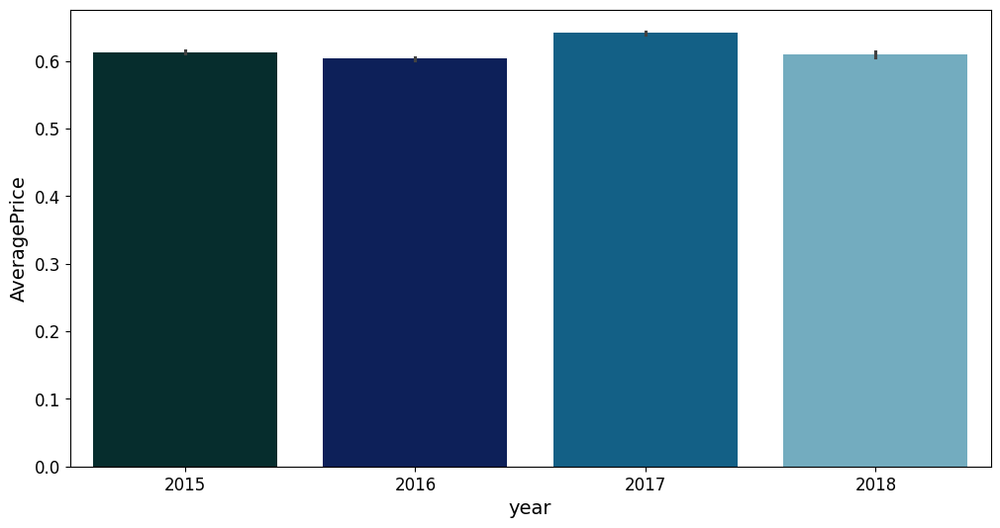

In [95]:
f, ax = plt.subplots(figsize=(12, 6))
ax = sns.barplot(x='year', y='AveragePrice', data=data, palette=("ocean"))

([<matplotlib.patches.Wedge at 0x7f75decec910>,
  ...],
 [Text(1.7129497471717527, 0.00029471895990492434, ''),
  Text(1.7175692306008983, 0.0008865413442557136, ''),
  Text(1.6053219171124047, 0.0013810064146620674, ''),
  Text(1.6494880010432809, 0.0019866019617260002, ''),
  Text(1.7011260333862301, 0.002634163918937248, ''),
  Text(1.6962834086188692, 0.0032103698438776707, ''),
  Text(1.6236200939414314, 0.003631549292237777, ''),
  Text(1.6206300593062057, 0.004182534793912298, ''),
  Text(1.6324416757813354, 0.00477475709610065, ''),
  Text(1.6466946149047959, 0.005383090268872794, ''),
  Text(1.6604138161225772, 0.005999305423442339, ''),
  Text(1.701114753329729, 0.0067317373580160515, ''),
  Text(1.708252738310111, 0.00734781582272532, ''),
  Text(1.623606636283915, 0.007542427691083136, ''),
  Text(1.7129284500989441, 0.00854681441627127, ''),
  Text(1.7011038761560011, 0.009073191883271449, ''),
  Text(1.6576946733466547, 0.009412101413646942, ''),
  Text(1.6466735565551605

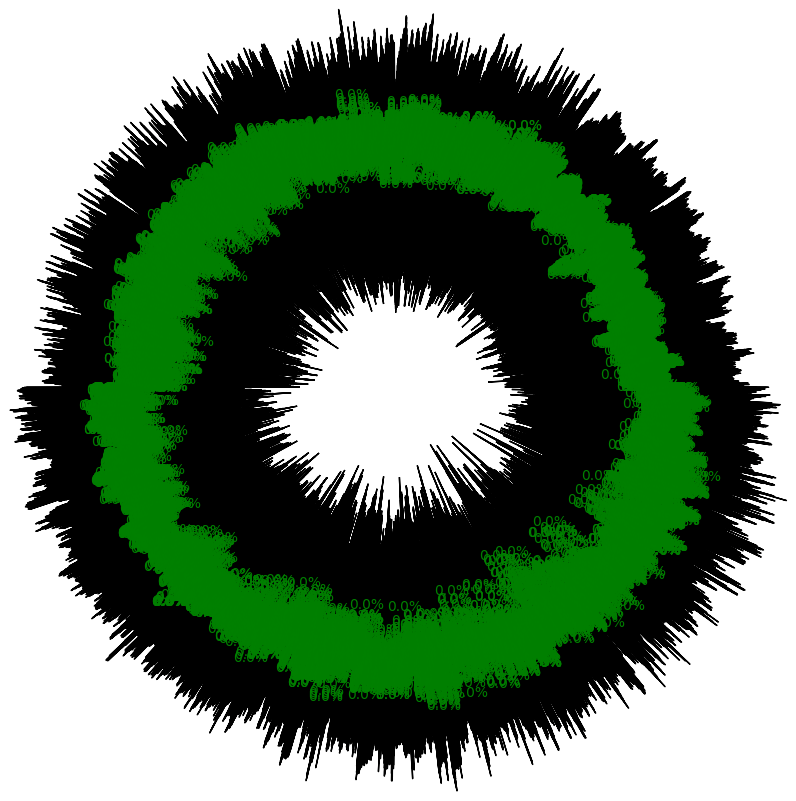

In [83]:
plt.pie(data['year'], data['AveragePrice'], shadow=False,
        autopct = '%1.1f%%', wedgeprops={'edgecolor':'black'})

In [105]:
data_month = data.groupby('month', as_index=False)['AveragePrice'].agg({'month mean':sum})
data_month['month'] = ['January','February','March','April','May','June','July','August','September','October','November', 'December']
data_month.head()

,month,month mean
0,January,1164.219817
1,February,1016.539216
2,March,1108.450547
3,April,858.850059
4,May,914.539835


<Axes: xlabel='month', ylabel='month mean'>

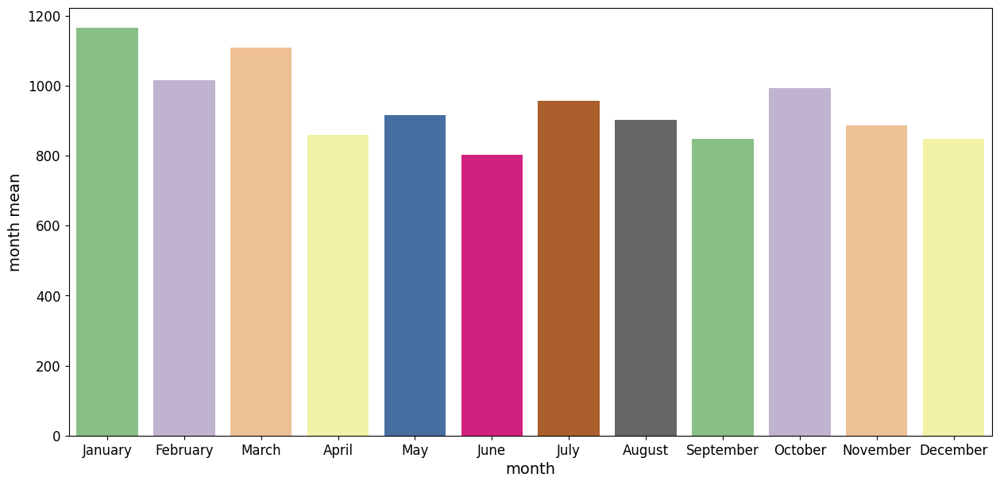

In [109]:
sns.barplot(x=data_month['month'], y=data_month['month mean'], palette=("Accent"))
#plt.xlabel(months_order)

(array([16436., 16556., 16679., 16801., 16922., 17045., 17167., 17287.,
        17410., 17532., 17652.]),
 [Text(16436.0, 0, '2015-01'),
  Text(16556.0, 0, '2015-05'),
  Text(16679.0, 0, '2015-09'),
  Text(16801.0, 0, '2016-01'),
  Text(16922.0, 0, '2016-05'),
  Text(17045.0, 0, '2016-09'),
  Text(17167.0, 0, '2017-01'),
  Text(17287.0, 0, '2017-05'),
  Text(17410.0, 0, '2017-09'),
  Text(17532.0, 0, '2018-01'),
  Text(17652.0, 0, '2018-05')])

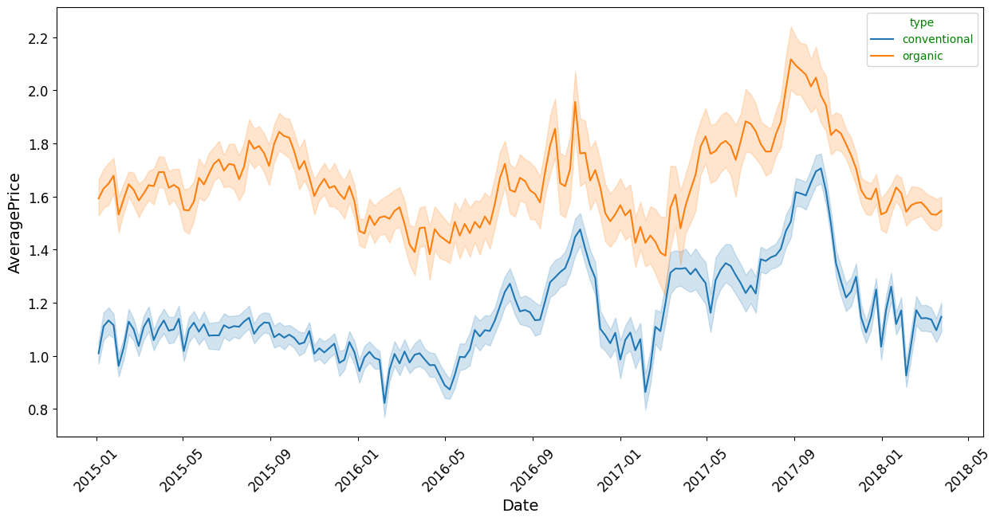

In [41]:
sns.lineplot(x='Date', y='AveragePrice', data=data, hue='type')
plt.xticks(rotation=45)

In [51]:
df = data.drop(['Date', 'year', 'region', 'type'], axis=1)

In [52]:
df.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,month
0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,12
1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,12
2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,12
3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,12
4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,11


In [54]:
df.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
month            0.106617
dtype: float64

In [65]:
high_skew = ['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags']
for col in high_skew:
    if df.skew().loc[col]>0.55:
        data[col] = np.log1p(data[col])

AveragePrice
Total Volume
4046
4225
4770
Total Bags
Small Bags
Large Bags
XLarge Bags


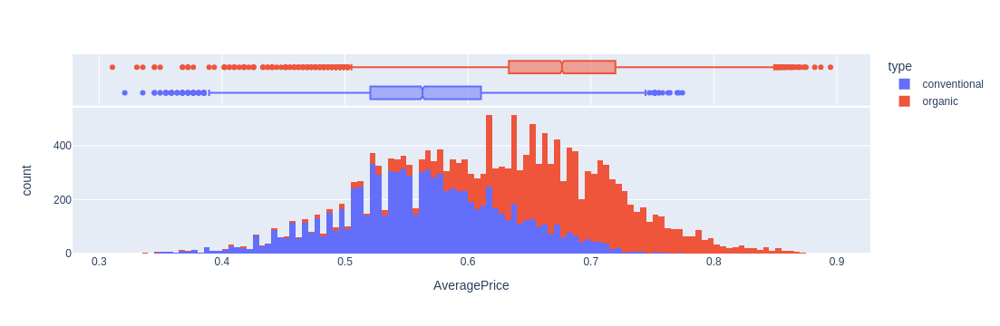

In [71]:
# Let's see the price distribution of two types of avocados.
fig = px.histogram(data, x='AveragePrice', color='type',
                   marginal='box',
                   hover_data=data.columns)


fig.show()

Text(0.5, 1.0, 'Correlation Matrix')

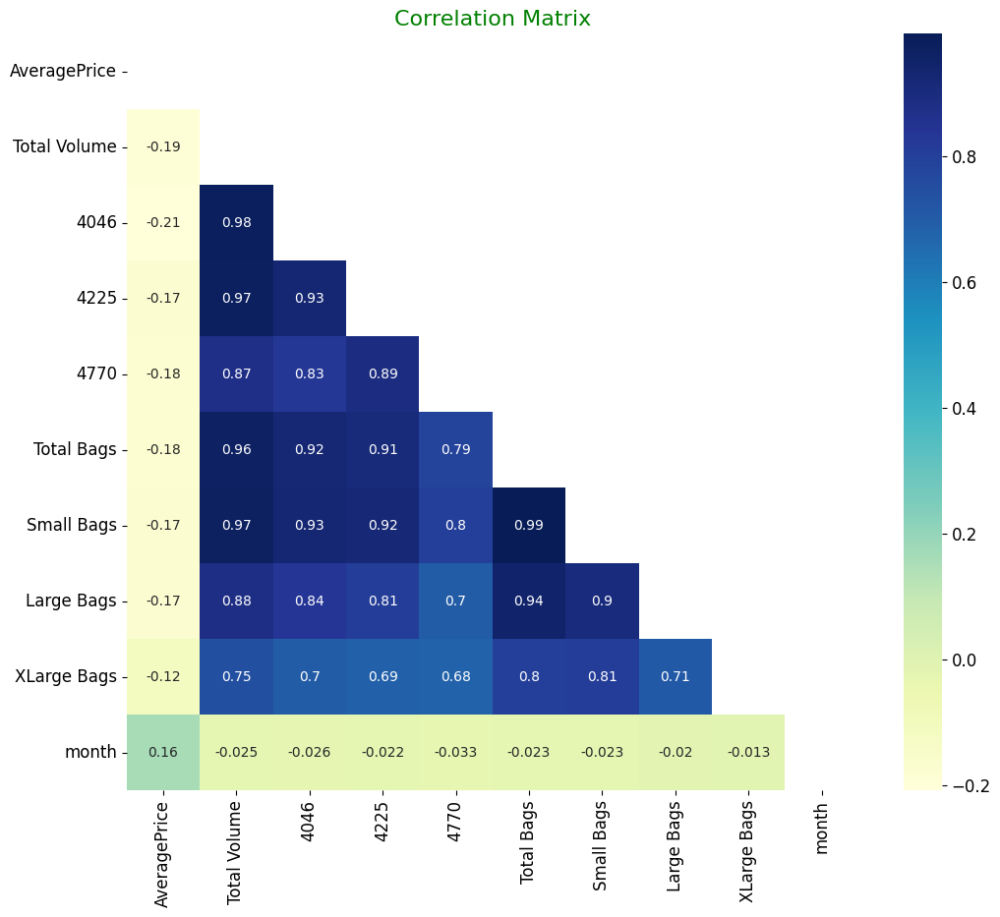

In [82]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 10))
mask = np.triu(np.ones_like(df.corr()))
sns.heatmap(df.corr(),cmap="YlGnBu", annot=True, mask=mask)
ax.set_title('Correlation Matrix', fontsize=16)